# Model 2: Binary Image

In [133]:
import pandas as pd
import numpy as np
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
#! pip install visualkeras
import visualkeras
import keras
import PIL

In [287]:
IMG_WIDTH=2304
IMG_HEIGHT=1728

batch_size=32

train_dir = '../Data/Binary_Sorted_Images_60thresh/train/'
#test_dir  = '../snow_images/test/'
#val_dir   = '../snow_images/val/'

image_gen_train = ImageDataGenerator(rescale=1./255,
                                     #zoom_range=0.2,
                                     #brightness_range=[0.4, 1.5],
                                     #rotation_range=5,
                                     #shear_range=5,
                                     horizontal_flip=True,
                                     #vertical_flip=True, 
                                     validation_split=0.2)

#image_gen_val = ImageDataGenerator(rescale=1./255)

#image_gen_test = ImageDataGenerator(rescale=1./255)

#ImageDataGenerator applys transformations so that the model receives new variations of the images
# at each epoch
#Then the "ImageDataGenerator" will produce 10 images in each iteration of the training. 
#An iteration is defined as steps per epoch i.e. the total number of samples / batch_size. 
#In above case, in each epoch of training there will be 100 iterations

Next cell from:
https://vijayabhaskar96.medium.com/tutorial-image-classification-with-keras-flow-from-directory-and-generators-95f75ebe5720

In [367]:
train_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      color_mode="grayscale",
                                                      shuffle=True,
                                                      target_size = (256, 256),
                                                      class_mode='binary')

val_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    target_size = (256, 256),
                                                    color_mode="grayscale",
                                                    class_mode='binary', 
                                                   shuffle=False)
 
#test_generator = image_gen_test.flow_from_directory(
 #   directory=test_dir,
  #  target_size=(IMG_HEIGHT, IMG_WIDTH),
   # color_mode="rgb",
    #batch_size=1,
 #   class_mode=None,
  #  shuffle=False,
   # seed=42)

#flow_from directory reads the image files from the directory
#https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/

Found 467 images belonging to 2 classes.
Found 115 images belonging to 2 classes.


(32, 256, 256, 1)


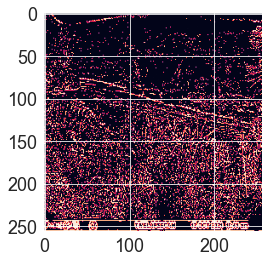

(32, 256, 256, 1)


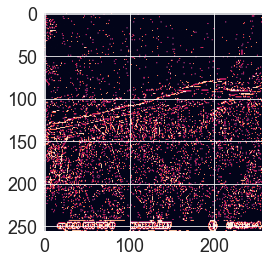

(32, 256, 256, 1)


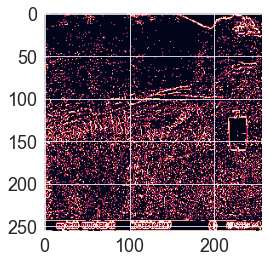

(32, 256, 256, 1)


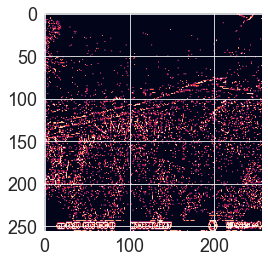

(32, 256, 256, 1)


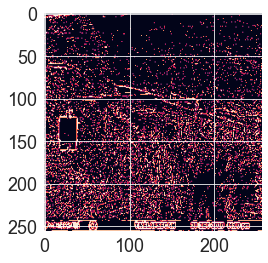

In [289]:
# visualise the augmented images

for i in range(5):
    img, label = train_generator.next()
    print(img.shape)   #  (1,256,256,3)
    plt.imshow(img[0])
    plt.show()

In [290]:
train_generator.class_indices.keys()

#extract the class names from the dataset in a dictionary

dict_keys(['high', 'low'])

In [291]:
#to remove .ipynb checkpoints, run in jupyter terminal in train directory:

# rm -rf `find -type d -name .ipynb_checkpoints'

In [292]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [293]:
model.summary()

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_84 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_85 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_85 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_33 (Flatten)        (None, 8192)              0         
                                                                 
 dense_66 (Dense)            (None, 32)              

In [294]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [295]:
#Fitting the model

epochs=400

history = model.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/400
15/15 [==============================] - 23s 1s/step - loss: 0.6960 - accuracy: 0.4818 - val_loss: 0.6914 - val_accuracy: 0.5304
Epoch 2/400
15/15 [==============================] - 20s 1s/step - loss: 0.6922 - accuracy: 0.5375 - val_loss: 0.6890 - val_accuracy: 0.5391
Epoch 3/400
15/15 [==============================] - 20s 1s/step - loss: 0.6907 - accuracy: 0.5525 - val_loss: 0.6859 - val_accuracy: 0.5826
Epoch 4/400
15/15 [==============================] - 21s 1s/step - loss: 0.6874 - accuracy: 0.5675 - val_loss: 0.6840 - val_accuracy: 0.5826
Epoch 5/400
15/15 [==============================] - 21s 1s/step - loss: 0.6865 - accuracy: 0.5931 - val_loss: 0.6834 - val_accuracy: 0.6087
Epoch 6/400
15/15 [==============================] - 21s 1s/step - loss: 0.6840 - accuracy: 0.6081 - val_loss: 0.6814 - val_accuracy: 0.6261
Epoch 7/400
15/15 [==============================] - 22s 1s/step - loss: 0.6836 - accuracy: 0.5974 - val_loss: 0.6808 - val_accuracy: 0.5652
Epoch 8/400
1

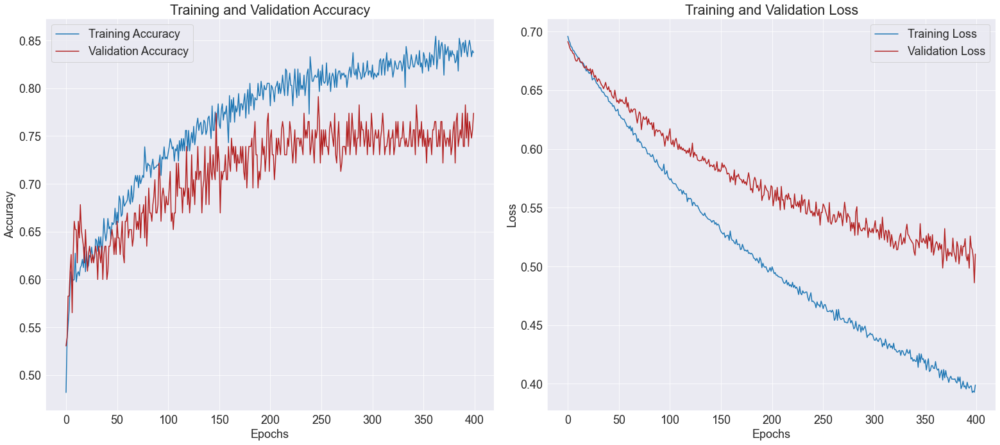

In [385]:
# Set figure size
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model2')
plt.show()


In [98]:
from PIL import ImageFont

#font = ImageFont.load("arial.pil")
font = ImageFont.truetype("../Data/fonts/arial.ttf", 24)

visualkeras.layered_view(model, legend=True, spacing=60, font=font).show() # display using your system viewer

# Validation metrics

In [536]:
#Model 1

score1 = model2.evaluate(val_generator2, verbose = 0) 

print('Validation loss:', score1[0]) 
print('Validation accuracy:', score1[1])

Validation loss: 1.6264166831970215
Validation accuracy: 0.5603448152542114


In [527]:
#Model 2

score2 = model.evaluate(val_generator, verbose = 0) 

print('Validation loss:', score2[0]) 
print('Validation accuracy:', score2[1])

Validation loss: 0.5034307241439819
Validation accuracy: 0.7565217614173889


In [528]:
#Model 3

score3 = model3.evaluate(val_generator, verbose = 0) 

print('Validation loss:', score3[0]) 
print('Validation accuracy:', score3[1])

Validation loss: 0.6590396165847778
Validation accuracy: 0.6521739363670349


In [529]:
#Model 4

score4 = model7_2.evaluate(val_generator, verbose = 0) 

print('Validation loss:', score4[0]) 
print('Validation accuracy:', score4[1])

Validation loss: 0.6398842334747314
Validation accuracy: 0.782608687877655


In [530]:
#Model 5

score5 = model8_2.evaluate(val_generator, verbose = 0) 

print('Validation loss:', score5[0]) 
print('Validation accuracy:', score5[1])

Validation loss: 2.1444485187530518
Validation accuracy: 0.6000000238418579


In [531]:
#Model 6

score6 = model9_3.evaluate(val_generator, verbose = 0) 

print('Validation loss:', score6[0]) 
print('Validation accuracy:', score6[1])

Validation loss: 0.674948513507843
Validation accuracy: 0.7739130258560181


Note: validation accuracy not increasing?

The size of the training dataset is less than 3K. While the amount of the trainable parameters is around 3 million. The answer to your question is classical overfitting - the model is so huge, that just remember the training subset instead of a generalization.

How to improve the current situation:

- try to generate or find more data;
- reduce the complexity of the model:
    - reduce the number of the LSTM nodes

# Older models

# Model 9 - Same as 8 but with l1 and l2 regulariser and back to simple no of double conv and max pool layers

In [223]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model9=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1_l2'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [224]:
model9.summary()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_58 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_59 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_59 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_23 (Flatten)        (None, 8192)              0         
                                                                 
 dense_46 (Dense)            (None, 32)              

In [571]:
model9.save('Models/model6.h5')
model8.save('Models/model5.h5')
model7.save('Models/model4.h5')
model3.save('Models/model3.h5')
model2.save('Models/model2.h5')

In [225]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model9.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [226]:
#Fitting the model

epochs=100

history9 = model9.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/100
15/15 [==============================] - 25s 2s/step - loss: 0.9286 - accuracy: 0.5011 - val_loss: 0.9260 - val_accuracy: 0.5217
Epoch 2/100
15/15 [==============================] - 25s 2s/step - loss: 0.9267 - accuracy: 0.5332 - val_loss: 0.9234 - val_accuracy: 0.5913
Epoch 3/100
15/15 [==============================] - 21s 1s/step - loss: 0.9234 - accuracy: 0.5589 - val_loss: 0.9249 - val_accuracy: 0.5478
Epoch 4/100
15/15 [==============================] - 22s 1s/step - loss: 0.9218 - accuracy: 0.5653 - val_loss: 0.9219 - val_accuracy: 0.5739
Epoch 5/100
15/15 [==============================] - 30s 2s/step - loss: 0.9217 - accuracy: 0.5889 - val_loss: 0.9215 - val_accuracy: 0.5913
Epoch 6/100
15/15 [==============================] - 33s 2s/step - loss: 0.9183 - accuracy: 0.5846 - val_loss: 0.9163 - val_accuracy: 0.5913
Epoch 7/100
15/15 [==============================] - 26s 2s/step - loss: 0.9185 - accuracy: 0.5889 - val_loss: 0.9144 - val_accuracy: 0.6348
Epoch 8/100
1

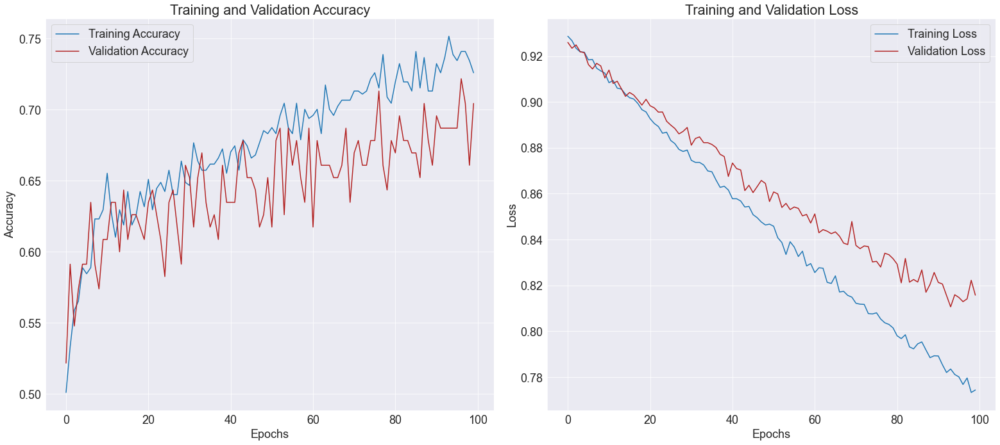

In [399]:
# Set figure size
acc9 = history9.history['accuracy']
val_acc9 = history9.history['val_accuracy']
loss9 = history9.history['loss']
val_loss9 = history9.history['val_loss']

epochs_range = range(100)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc9, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc9, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss9, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss9, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 7", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model6_100epochs')
plt.show()


# Running again but for 200 epochs

In [232]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model9_2=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1_l2'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [233]:
model9_2.summary()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_60 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_61 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_61 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_24 (Flatten)        (None, 8192)              0         
                                                                 
 dense_48 (Dense)            (None, 32)              

In [234]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model9_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [236]:
#Fitting the model

epochs2 = 200

history9_2 = model9_2.fit(train_generator, validation_data=val_generator, epochs=epochs2)



Epoch 1/200
15/15 [==============================] - 20s 1s/step - loss: 0.8056 - accuracy: 0.7131 - val_loss: 0.8283 - val_accuracy: 0.6870
Epoch 2/200
15/15 [==============================] - 20s 1s/step - loss: 0.8047 - accuracy: 0.7045 - val_loss: 0.8299 - val_accuracy: 0.6435
Epoch 3/200
15/15 [==============================] - 21s 1s/step - loss: 0.8035 - accuracy: 0.7173 - val_loss: 0.8307 - val_accuracy: 0.6348
Epoch 4/200
15/15 [==============================] - 20s 1s/step - loss: 0.8019 - accuracy: 0.7045 - val_loss: 0.8253 - val_accuracy: 0.6522
Epoch 5/200
15/15 [==============================] - 22s 1s/step - loss: 0.7972 - accuracy: 0.7173 - val_loss: 0.8258 - val_accuracy: 0.6609
Epoch 6/200
15/15 [==============================] - 22s 1s/step - loss: 0.8019 - accuracy: 0.7152 - val_loss: 0.8276 - val_accuracy: 0.6783
Epoch 7/200
15/15 [==============================] - 28s 2s/step - loss: 0.7992 - accuracy: 0.7238 - val_loss: 0.8262 - val_accuracy: 0.6696
Epoch 8/200
1

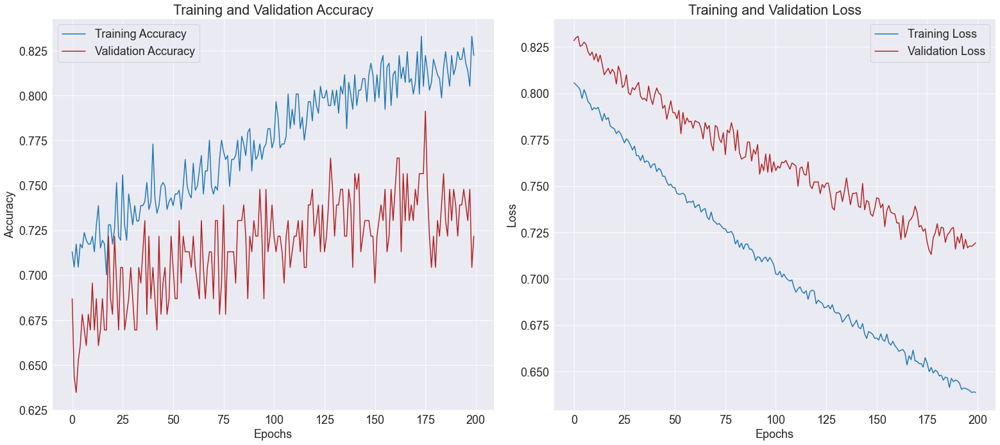

In [397]:
# Set figure size
acc9_2 = history9_2.history['accuracy']
val_acc9_2 = history9_2.history['val_accuracy']
loss9_2 = history9_2.history['loss']
val_loss9_2 = history9_2.history['val_loss']

epochs_range2 = range(epochs2)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range2, acc9_2, label='Training Accuracy')
ax2 = plt.plot(epochs_range2, val_acc9_2, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range2, loss9_2, label='Training Loss')
ax2 = plt.plot(epochs_range2, val_loss9_2, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 9.2", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model6_200epochs')
plt.show()


# Running again but for 400 epochs

In [242]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model9_3=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1_l2'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [243]:
model9_3.summary()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_64 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_64 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_65 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_65 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_26 (Flatten)        (None, 8192)              0         
                                                                 
 dense_52 (Dense)            (None, 32)              

In [244]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model9_3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [246]:
#Fitting the model

epochs3 = 400

history9_3 = model9_3.fit(train_generator, validation_data=val_generator, epochs=epochs3)



Epoch 1/400
15/15 [==============================] - 28s 2s/step - loss: 0.9179 - accuracy: 0.4347 - val_loss: 0.9187 - val_accuracy: 0.3826
Epoch 2/400
15/15 [==============================] - 26s 2s/step - loss: 0.9160 - accuracy: 0.4711 - val_loss: 0.9143 - val_accuracy: 0.4870
Epoch 3/400
15/15 [==============================] - 22s 1s/step - loss: 0.9138 - accuracy: 0.4904 - val_loss: 0.9155 - val_accuracy: 0.4435
Epoch 4/400
15/15 [==============================] - 22s 1s/step - loss: 0.9116 - accuracy: 0.5139 - val_loss: 0.9105 - val_accuracy: 0.5565
Epoch 5/400
15/15 [==============================] - 22s 1s/step - loss: 0.9108 - accuracy: 0.5268 - val_loss: 0.9108 - val_accuracy: 0.5478
Epoch 6/400
15/15 [==============================] - 22s 1s/step - loss: 0.9093 - accuracy: 0.5396 - val_loss: 0.9108 - val_accuracy: 0.5217
Epoch 7/400
15/15 [==============================] - 27s 2s/step - loss: 0.9080 - accuracy: 0.5353 - val_loss: 0.9103 - val_accuracy: 0.5391
Epoch 8/400
1

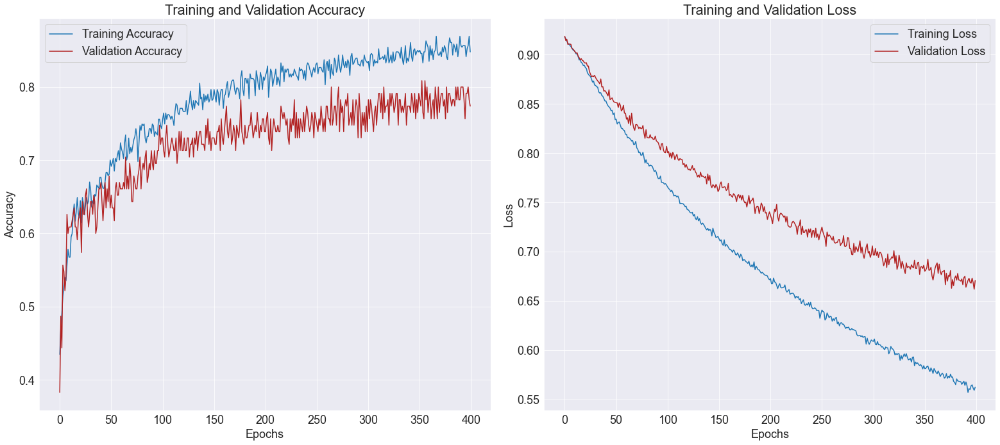

In [396]:
# Set figure size
acc9_3 = history9_3.history['accuracy']
val_acc9_3 = history9_3.history['val_accuracy']
loss9_3 = history9_3.history['loss']
val_loss9_3 = history9_3.history['val_loss']

epochs_range3 = range(epochs3)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range3, acc9_3, label='Training Accuracy')
ax2 = plt.plot(epochs_range3, val_acc9_3, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range3, loss9_3, label='Training Loss')
ax2 = plt.plot(epochs_range3, val_loss9_3, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 9.3", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model9_400epochs')
plt.show()


# Confusion Matrix
## Model 6

In [466]:
y_true6 = val_generator.classes
y_pred6 = model9_3.predict(val_generator).round()

In [467]:
class_dict= val_generator.class_indices
print(class_dict)

{'high': 0, 'low': 1}


In [468]:
len(y_true6)

115

In [469]:
len(y_pred6)

115

In [470]:
cf_matrix6 = sklearn.metrics.confusion_matrix(y_true6, y_pred6)

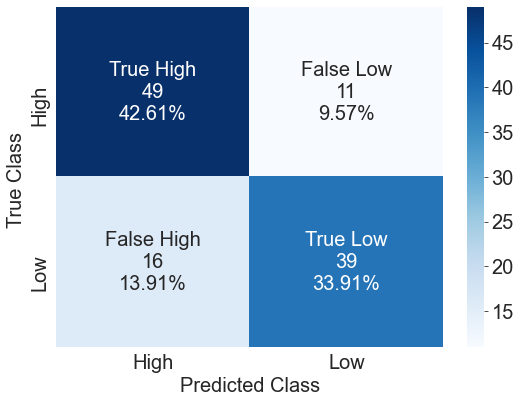

In [493]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix6.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix6.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix6, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
#plt.savefig('Metrics_Graphs2/CFmatrix6')
plt.show()

## Model 5

In [490]:
y_true5 = val_generator.classes
y_pred5 = model8_2.predict(val_generator).round()

In [491]:
cf_matrix5 = sklearn.metrics.confusion_matrix(y_true5, y_pred5)

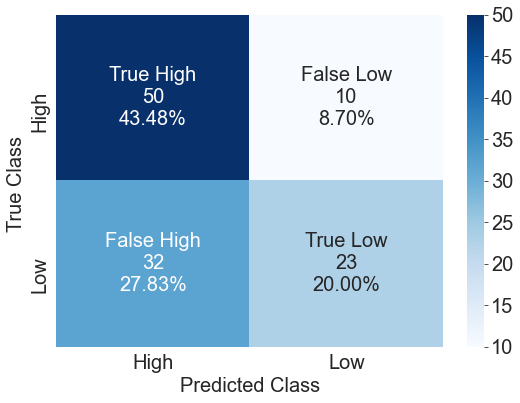

In [512]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix5.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix5.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix5, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
plt.savefig('Metrics_Graphs2/CFmatrix5')
plt.show()

## Model 4

In [495]:
y_true4 = val_generator.classes
y_pred4 = model7_2.predict(val_generator).round()

In [496]:
cf_matrix4 = sklearn.metrics.confusion_matrix(y_true4, y_pred4)

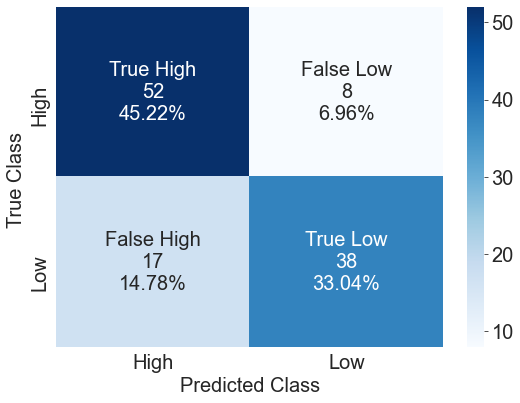

In [511]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix4.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix4.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix4, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
plt.savefig('Metrics_Graphs2/CFmatrix4')
plt.show()

## Model 3

In [500]:
y_true3 = val_generator.classes
y_pred3 = model3.predict(val_generator).round()

In [503]:
cf_matrix3 = sklearn.metrics.confusion_matrix(y_true3, y_pred3)

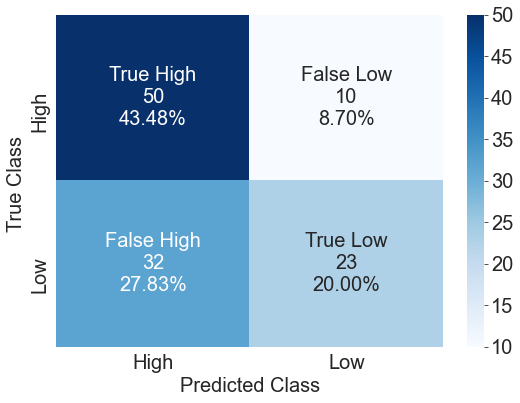

In [510]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix3.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix3.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix3, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
plt.savefig('Metrics_Graphs2/CFmatrix3')
plt.show()

## Model 2

In [515]:
y_true2 = val_generator.classes
y_pred2 = model.predict(val_generator).round()

In [516]:
cf_matrix2 = sklearn.metrics.confusion_matrix(y_true2, y_pred2)

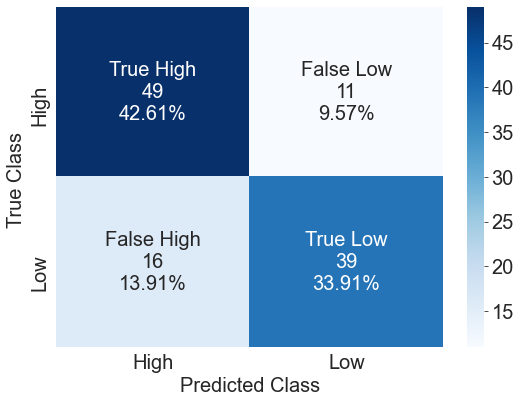

In [517]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix2.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix2.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix2, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
plt.savefig('Metrics_Graphs2/CFmatrix2')
plt.show()

## Model 1

In [518]:
y_true1 = val_generator.classes
y_pred1 = model2.predict(val_generator).round()

InvalidArgumentError:  input depth must be evenly divisible by filter depth: 1 vs 3
	 [[node sequential_32/conv2d_82/Relu
 (defined at /Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/backend.py:4867)
]] [Op:__inference_predict_function_512940]

Errors may have originated from an input operation.
Input Source operations connected to node sequential_32/conv2d_82/Relu:
In[0] sequential_32/conv2d_82/BiasAdd (defined at /Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/layers/convolutional.py:264)

Operation defined at: (most recent call last)
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/runpy.py", line 194, in _run_module_as_main
>>>     return _run_code(code, main_globals, None,
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/runpy.py", line 87, in _run_code
>>>     exec(code, run_globals)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel_launcher.py", line 16, in <module>
>>>     app.launch_new_instance()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/traitlets/config/application.py", line 845, in launch_instance
>>>     app.start()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 612, in start
>>>     self.io_loop.start()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 199, in start
>>>     self.asyncio_loop.run_forever()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/asyncio/base_events.py", line 570, in run_forever
>>>     self._run_once()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/asyncio/base_events.py", line 1859, in _run_once
>>>     handle._run()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/asyncio/events.py", line 81, in _run
>>>     self._context.run(self._callback, *self._args)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/ioloop.py", line 688, in <lambda>
>>>     lambda f: self._run_callback(functools.partial(callback, future))
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/ioloop.py", line 741, in _run_callback
>>>     ret = callback()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/gen.py", line 814, in inner
>>>     self.ctx_run(self.run)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/gen.py", line 775, in run
>>>     yielded = self.gen.send(value)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 365, in process_one
>>>     yield gen.maybe_future(dispatch(*args))
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/gen.py", line 234, in wrapper
>>>     yielded = ctx_run(next, result)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 268, in dispatch_shell
>>>     yield gen.maybe_future(handler(stream, idents, msg))
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/gen.py", line 234, in wrapper
>>>     yielded = ctx_run(next, result)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 543, in execute_request
>>>     self.do_execute(
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/tornado/gen.py", line 234, in wrapper
>>>     yielded = ctx_run(next, result)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py", line 306, in do_execute
>>>     res = shell.run_cell(code, store_history=store_history, silent=silent)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/ipykernel/zmqshell.py", line 536, in run_cell
>>>     return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2894, in run_cell
>>>     result = self._run_cell(
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2940, in _run_cell
>>>     return runner(coro)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/async_helpers.py", line 68, in _pseudo_sync_runner
>>>     coro.send(None)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3165, in run_cell_async
>>>     has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3357, in run_ast_nodes
>>>     if (await self.run_code(code, result,  async_=asy)):
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
>>>     exec(code_obj, self.user_global_ns, self.user_ns)
>>> 
>>>   File "<ipython-input-513-0dab6a139b63>", line 2, in <module>
>>>     y_pred1 = model2.predict(val_generator).round()
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/training.py", line 1789, in predict
>>>     tmp_batch_outputs = self.predict_function(iterator)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/training.py", line 1621, in predict_function
>>>     return step_function(self, iterator)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/training.py", line 1611, in step_function
>>>     outputs = model.distribute_strategy.run(run_step, args=(data,))
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/training.py", line 1604, in run_step
>>>     outputs = model.predict_step(data)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/training.py", line 1572, in predict_step
>>>     return self(x, training=False)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/sequential.py", line 373, in call
>>>     return super(Sequential, self).call(inputs, training=training, mask=mask)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/functional.py", line 451, in call
>>>     return self._run_internal_graph(
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/functional.py", line 589, in _run_internal_graph
>>>     outputs = node.layer(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/engine/base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/layers/convolutional.py", line 273, in call
>>>     return self.activation(outputs)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/activations.py", line 311, in relu
>>>     return backend.relu(x, alpha=alpha, max_value=max_value, threshold=threshold)
>>> 
>>>   File "/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/backend.py", line 4867, in relu
>>>     x = tf.nn.relu(x)
>>> 

In [491]:
cf_matrix5 = sklearn.metrics.confusion_matrix(y_true1, y_pred1)

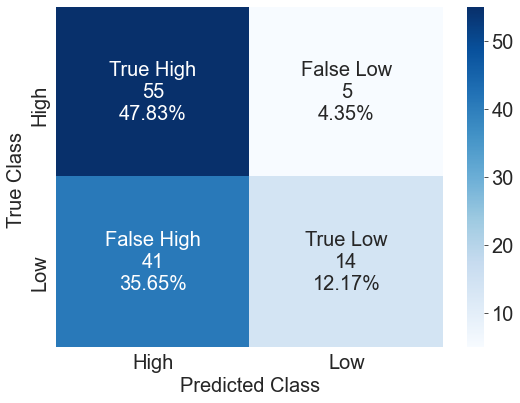

In [494]:
group_names = ['True High','False Low','False High','True Low']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix5.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix5.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)
plt.figure(figsize=(8,6))
plt.rcParams['font.size'] = '20'
ax = sns.heatmap(cf_matrix5, annot=labels, fmt='', cmap='Blues')

#ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['High','Low'])
ax.yaxis.set_ticklabels(['High','Low'])

## Display the visualization of the Confusion Matrix.
plt.tight_layout()
plt.savefig('Metrics_Graphs2/CFmatrix5')
plt.show()

# Model 8 - Same as 7 but with double conv and max pool layers - BINARY5 in report

In [259]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model8_2=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [260]:
model8_2.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_74 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_74 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_75 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_75 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_76 (Conv2D)          (None, 8, 8, 32)          9248      
                                                                 
 max_pooling2d_76 (MaxPoolin  (None, 4, 4, 32)       

In [261]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model8_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [262]:
#Fitting the model

epochs=400

history8_2 = model8_2.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/400
15/15 [==============================] - 23s 1s/step - loss: 5.5453 - accuracy: 0.5332 - val_loss: 5.5372 - val_accuracy: 0.5913
Epoch 2/400
15/15 [==============================] - 21s 1s/step - loss: 5.5313 - accuracy: 0.5225 - val_loss: 5.5222 - val_accuracy: 0.6174
Epoch 3/400
15/15 [==============================] - 21s 1s/step - loss: 5.5163 - accuracy: 0.5289 - val_loss: 5.5088 - val_accuracy: 0.6000
Epoch 4/400
15/15 [==============================] - 26s 2s/step - loss: 5.5024 - accuracy: 0.5460 - val_loss: 5.4952 - val_accuracy: 0.6087
Epoch 5/400
15/15 [==============================] - 24s 2s/step - loss: 5.4884 - accuracy: 0.5525 - val_loss: 5.4808 - val_accuracy: 0.6261
Epoch 6/400
15/15 [==============================] - 22s 1s/step - loss: 5.4747 - accuracy: 0.5439 - val_loss: 5.4667 - val_accuracy: 0.6261
Epoch 7/400
15/15 [==============================] - 22s 1s/step - loss: 5.4601 - accuracy: 0.5653 - val_loss: 5.4527 - val_accuracy: 0.5739
Epoch 8/400
1

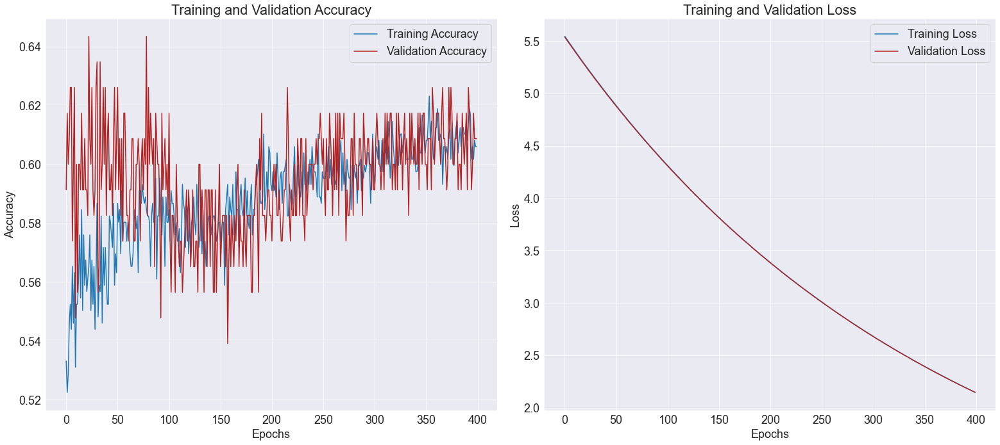

In [395]:
# Set figure size
acc8_2 = history8_2.history['accuracy']
val_acc8_2 = history8_2.history['val_accuracy']
loss8_2 = history8_2.history['loss']
val_loss8_2 = history8_2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc8_2, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc8_2, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss8_2, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss8_2, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 7", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model5_400epochs')
plt.show()


# Model 7 - Same as 6 but with kernel regulariser - Model 4 in report

In [266]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model7_2=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu', kernel_regularizer='l1'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [267]:
model7_2.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_78 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_79 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_30 (Flatten)        (None, 8192)              0         
                                                                 
 dense_60 (Dense)            (None, 32)              

In [268]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model7_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [269]:
#Fitting the model

epochs=400

history7_2 = model7_2.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/400
15/15 [==============================] - 26s 2s/step - loss: 0.8880 - accuracy: 0.4711 - val_loss: 0.8829 - val_accuracy: 0.5043
Epoch 2/400
15/15 [==============================] - 24s 2s/step - loss: 0.8842 - accuracy: 0.4925 - val_loss: 0.8819 - val_accuracy: 0.5217
Epoch 3/400
15/15 [==============================] - 21s 1s/step - loss: 0.8837 - accuracy: 0.5225 - val_loss: 0.8821 - val_accuracy: 0.5739
Epoch 4/400
15/15 [==============================] - 20s 1s/step - loss: 0.8807 - accuracy: 0.5503 - val_loss: 0.8802 - val_accuracy: 0.5739
Epoch 5/400
15/15 [==============================] - 20s 1s/step - loss: 0.8802 - accuracy: 0.5589 - val_loss: 0.8778 - val_accuracy: 0.5217
Epoch 6/400
15/15 [==============================] - 24s 2s/step - loss: 0.8792 - accuracy: 0.5460 - val_loss: 0.8795 - val_accuracy: 0.5304
Epoch 7/400
15/15 [==============================] - 25s 2s/step - loss: 0.8765 - accuracy: 0.5546 - val_loss: 0.8761 - val_accuracy: 0.5652
Epoch 8/400
1

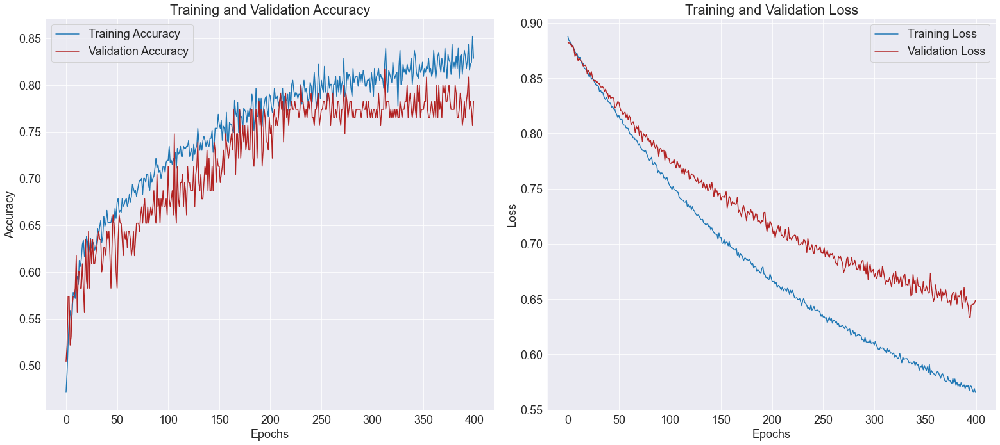

In [394]:
# Set figure size
acc7_2 = history7_2.history['accuracy']
val_acc7_2 = history7_2.history['val_accuracy']
loss7_2 = history7_2.history['loss']
val_loss7_2 = history7_2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc7_2, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc7_2, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss7_2, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss7_2, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 7", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model4_400epochs_2')
plt.show()


# Model 6 - Same as 2 but with binary cross entropy - BINARY2

In [272]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model6_2=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [273]:
model6_2.summary()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_80 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_81 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_81 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_31 (Flatten)        (None, 8192)              0         
                                                                 
 dense_62 (Dense)            (None, 32)              

In [274]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model6_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [275]:
#Fitting the model

epochs=400

history6_2 = model6_2.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/400
15/15 [==============================] - 23s 1s/step - loss: 0.7001 - accuracy: 0.5182 - val_loss: 0.6982 - val_accuracy: 0.5130
Epoch 2/400
15/15 [==============================] - 21s 1s/step - loss: 0.6956 - accuracy: 0.4839 - val_loss: 0.6915 - val_accuracy: 0.5391
Epoch 3/400
15/15 [==============================] - 22s 1s/step - loss: 0.6925 - accuracy: 0.5289 - val_loss: 0.6882 - val_accuracy: 0.5826
Epoch 4/400
15/15 [==============================] - 21s 1s/step - loss: 0.6889 - accuracy: 0.5525 - val_loss: 0.6918 - val_accuracy: 0.5739
Epoch 5/400
15/15 [==============================] - 22s 1s/step - loss: 0.6898 - accuracy: 0.5482 - val_loss: 0.6896 - val_accuracy: 0.5391
Epoch 6/400
15/15 [==============================] - 22s 1s/step - loss: 0.6889 - accuracy: 0.5418 - val_loss: 0.6905 - val_accuracy: 0.5826
Epoch 7/400
15/15 [==============================] - 22s 1s/step - loss: 0.6875 - accuracy: 0.5675 - val_loss: 0.6904 - val_accuracy: 0.5913
Epoch 8/400
1

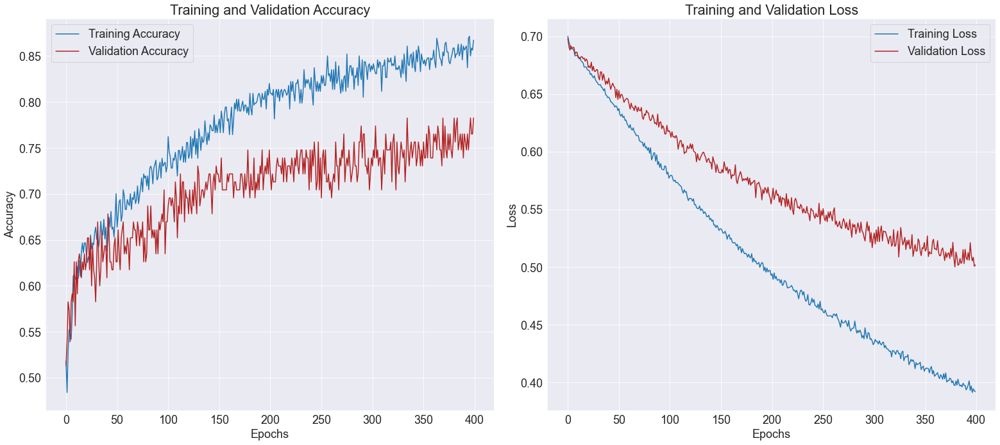

In [393]:
# Set figure size
acc6_2 = history6_2.history['accuracy']
val_acc6_2 = history6_2.history['val_accuracy']
loss6_2 = history6_2.history['loss']
val_loss6_2 = history6_2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc6_2, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc6_2, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss6_2, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss6_2, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle("Model 6", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model2_400epochs_2')
plt.show()


# Model 5 - Binary crossentropy and only 1 output neuron for sigmoid function - Model 2 in report

In [322]:
IMG_WIDTH=2304
IMG_HEIGHT=1728

batch_size=32



train_dir2 = '../Data/Binary_Sorted_Images_60thresh/train/'
#test_dir  = '../snow_images/test/'
#val_dir   = '../snow_images/val/'

image_gen_train2 = ImageDataGenerator(rescale=1./255,
                                     #zoom_range=0.2,
                                     #brightness_range=[0.4, 1.5],
                                     #rotation_range=5,
                                     #shear_range=5,
                                     horizontal_flip=True,
                                     #vertical_flip=True, 
                                     validation_split=0.2)

#ImageDataGenerator applys transformations so that the model receives new variations of the images
# at each epoch
#Then the "ImageDataGenerator" will produce 10 images in each iteration of the training. 
#An iteration is defined as steps per epoch i.e. the total number of samples / batch_size. 
#In above case, in each epoch of training there will be 100 iterations

In [323]:
train_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      color_mode="grayscale",
                                                      shuffle=True,
                                                      target_size = (256, 256),
                                                      class_mode='binary')

val_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    target_size = (256, 256),
                                                    color_mode="grayscale",
                                                    class_mode='binary')
 
#test_generator = image_gen_test.flow_from_directory(
 #   directory=test_dir,
  #  target_size=(IMG_HEIGHT, IMG_WIDTH),
   # color_mode="rgb",
    #batch_size=1,
 #   class_mode=None,
  #  shuffle=False,
   # seed=42)

#flow_from directory reads the image files from the directory
#https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/

Found 467 images belonging to 2 classes.
Found 115 images belonging to 2 classes.


In [324]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model5=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu'), #kernel_regularizer='l1'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [325]:
model5.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_94 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_94 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_95 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_95 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_37 (Flatten)        (None, 8192)              0         
                                                                 
 dense_74 (Dense)            (None, 32)              

In [326]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [327]:
#Fitting the model

epochs=100

history5 = model5.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/100
15/15 [==============================] - 23s 1s/step - loss: 0.6942 - accuracy: 0.4797 - val_loss: 0.6963 - val_accuracy: 0.4348
Epoch 2/100
15/15 [==============================] - 20s 1s/step - loss: 0.6922 - accuracy: 0.5268 - val_loss: 0.6928 - val_accuracy: 0.4957
Epoch 3/100
15/15 [==============================] - 20s 1s/step - loss: 0.6890 - accuracy: 0.5889 - val_loss: 0.6918 - val_accuracy: 0.4957
Epoch 4/100
15/15 [==============================] - 21s 1s/step - loss: 0.6905 - accuracy: 0.5589 - val_loss: 0.6926 - val_accuracy: 0.4870
Epoch 5/100
15/15 [==============================] - 21s 1s/step - loss: 0.6897 - accuracy: 0.5161 - val_loss: 0.6919 - val_accuracy: 0.5130
Epoch 6/100
15/15 [==============================] - 23s 2s/step - loss: 0.6872 - accuracy: 0.5782 - val_loss: 0.6891 - val_accuracy: 0.5391
Epoch 7/100
15/15 [==============================] - 24s 2s/step - loss: 0.6856 - accuracy: 0.5996 - val_loss: 0.6914 - val_accuracy: 0.4957
Epoch 8/100
1

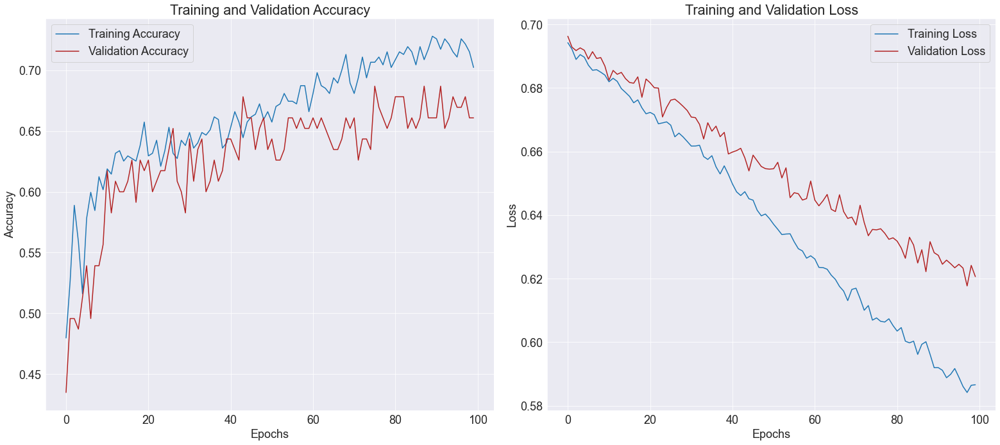

In [392]:
# Set figure size
acc5 = history5.history['accuracy']
val_acc5 = history5.history['val_accuracy']
loss5 = history5.history['loss']
val_loss5 = history5.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(range(100), acc5, label='Training Accuracy')
ax2 = plt.plot(range(100), val_acc5, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(range(100), loss5, label='Training Loss')
ax2 = plt.plot(range(100), val_loss5, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model2_100epochs')
plt.show()


## Model 3: Binary

Double the amount of conv2d and maxpool layers

In [297]:
IMG_WIDTH=2304
IMG_HEIGHT=1728

batch_size=32



train_dir2 = '../Data/Binary_Sorted_Images_60thresh/train/'
#test_dir  = '../snow_images/test/'
#val_dir   = '../snow_images/val/'

image_gen_train2 = ImageDataGenerator(rescale=1./255,
                                     #zoom_range=0.2,
                                     #brightness_range=[0.4, 1.5],
                                     #rotation_range=5,
                                     #shear_range=5,
                                     horizontal_flip=True,
                                     #vertical_flip=True, 
                                     validation_split=0.2)

#ImageDataGenerator applys transformations so that the model receives new variations of the images
# at each epoch
#Then the "ImageDataGenerator" will produce 10 images in each iteration of the training. 
#An iteration is defined as steps per epoch i.e. the total number of samples / batch_size. 
#In above case, in each epoch of training there will be 100 iterations

In [298]:
train_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      color_mode="grayscale",
                                                      shuffle=True,
                                                      target_size = (256, 256),
                                                      class_mode='binary')

val_generator = image_gen_train.flow_from_directory(directory=train_dir,
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    target_size = (256, 256),
                                                    color_mode="grayscale",
                                                    class_mode='binary')
 
#test_generator = image_gen_test.flow_from_directory(
 #   directory=test_dir,
  #  target_size=(IMG_HEIGHT, IMG_WIDTH),
   # color_mode="rgb",
    #batch_size=1,
 #   class_mode=None,
  #  shuffle=False,
   # seed=42)

#flow_from directory reads the image files from the directory
#https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/

Found 467 images belonging to 2 classes.
Found 115 images belonging to 2 classes.


In [299]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model3=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 1)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [300]:
model3.summary()

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_86 (Conv2D)          (None, 128, 128, 32)      320       
                                                                 
 max_pooling2d_86 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_87 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_87 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_88 (Conv2D)          (None, 8, 8, 32)          9248      
                                                                 
 max_pooling2d_88 (MaxPoolin  (None, 4, 4, 32)       

In [301]:
#Compile the model
#model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#trying much smaller learning rate to try improve val_acc

model3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-6, beta_1=0.9, beta_2=0.999, 
epsilon=1e-08, decay=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#(optimizer=optimizers.Adam(lr=10e-6, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0001)
#https://stackoverflow.com/questions/52356068/validation-accuracy-constant-in-keras-cnn-for-multiclass-image-classification

In [303]:
#Fitting the model

epochs=400

history3 = model3.fit(train_generator, validation_data=val_generator, epochs=epochs)



Epoch 1/400
15/15 [==============================] - 30s 2s/step - loss: 0.6957 - accuracy: 0.4775 - val_loss: 0.6948 - val_accuracy: 0.4783
Epoch 2/400
15/15 [==============================] - 35s 2s/step - loss: 0.6953 - accuracy: 0.4775 - val_loss: 0.6939 - val_accuracy: 0.4783
Epoch 3/400
15/15 [==============================] - 37s 2s/step - loss: 0.6950 - accuracy: 0.4775 - val_loss: 0.6940 - val_accuracy: 0.4783
Epoch 4/400
15/15 [==============================] - 37s 2s/step - loss: 0.6948 - accuracy: 0.4775 - val_loss: 0.6943 - val_accuracy: 0.4783
Epoch 5/400
15/15 [==============================] - 41s 3s/step - loss: 0.6945 - accuracy: 0.4775 - val_loss: 0.6933 - val_accuracy: 0.4783
Epoch 6/400
15/15 [==============================] - 37s 3s/step - loss: 0.6944 - accuracy: 0.4775 - val_loss: 0.6939 - val_accuracy: 0.4783
Epoch 7/400
15/15 [==============================] - 39s 3s/step - loss: 0.6939 - accuracy: 0.4775 - val_loss: 0.6936 - val_accuracy: 0.4783
Epoch 8/400
1

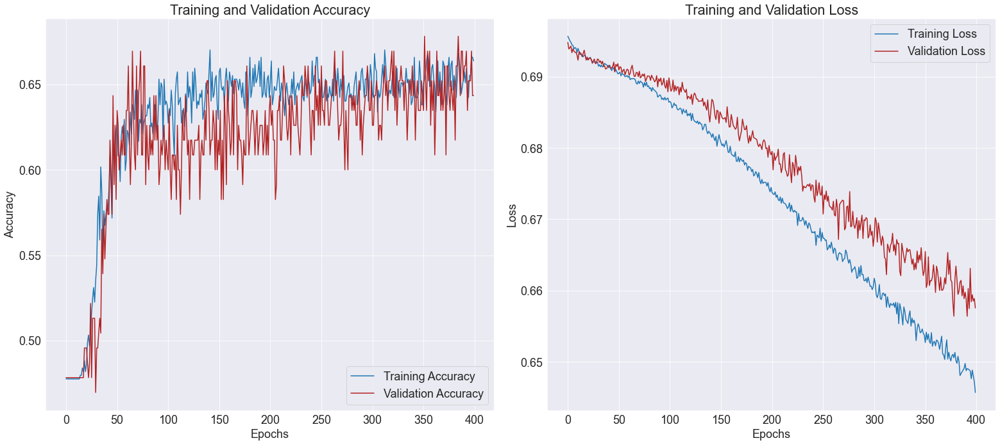

In [387]:
# Set figure size
acc3 = history3.history['accuracy']
val_acc3 = history3.history['val_accuracy']
loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc3, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc3, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss3, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss3, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)

plt.tight_layout()
plt.savefig('Metrics_Graphs2/model3')
plt.show()


In [98]:
from PIL import ImageFont

#font = ImageFont.load("arial.pil")
font = ImageFont.truetype("../Data/fonts/arial.ttf", 24)

visualkeras.layered_view(model, legend=True, spacing=60, font=font).show() # display using your system viewer


# Model 1: RGB

In [74]:
#Colour RGB

In [522]:
IMG_WIDTH=2304
IMG_HEIGHT=1728

batch_size=32



train_dir2 = '../Data/Sorted_Images_All/train/'
#test_dir  = '../snow_images/test/'
#val_dir   = '../snow_images/val/'

image_gen_train2 = ImageDataGenerator(rescale=1./255,
                                     #zoom_range=0.2,
                                     #brightness_range=[0.4, 1.5],
                                     #rotation_range=5,
                                     #shear_range=5,
                                     horizontal_flip=True,
                                     #vertical_flip=True, 
                                     validation_split=0.2)

#ImageDataGenerator applys transformations so that the model receives new variations of the images
# at each epoch
#Then the "ImageDataGenerator" will produce 10 images in each iteration of the training. 
#An iteration is defined as steps per epoch i.e. the total number of samples / batch_size. 
#In above case, in each epoch of training there will be 100 iterations

In [523]:
train_generator2 = image_gen_train2.flow_from_directory(directory=train_dir2,
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      color_mode="rgb",
                                                      shuffle=True,
                                                      target_size = (256, 256),
                                                      class_mode='binary')

val_generator2 = image_gen_train2.flow_from_directory(directory=train_dir2,
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    target_size = (256, 256),
                                                    color_mode="rgb",
                                                    class_mode='binary')
 
#flow_from directory reads the image files from the directory
#https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/

Found 469 images belonging to 2 classes.
Found 116 images belonging to 2 classes.


In [524]:
#Create Deep Learning model, compile it, and train the model:

#Define the model

model2=tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(256, 256, 3)),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same",strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", strides=(2, 2), 
                                   activation='relu'),
            tf.keras.layers.MaxPool2D(),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(32,activation="relu"),
            tf.keras.layers.Dense(1, activation="sigmoid")
         ])

In [539]:
model2.summary()

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_96 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_97 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 flatten_38 (Flatten)        (None, 8192)              0         
                                                                 
 dense_76 (Dense)            (None, 32)              

In [548]:
! pip install pydotplus

     |████████████████████████████████| 278 kB 259 kB/s eta 0:00:01
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=f02f342b59777c06e9e7b62df231b37004d35ce1a400171e0ad3dd0b6fb978a3
  Stored in directory: /Users/catefraser/Library/Caches/pip/wheels/fe/cd/78/a7e873cc049759194f8271f780640cf96b35e5a48bef0e2f36
Successfully built pydotplus


In [567]:
import pydot_ng as pydot
import graphviz
#from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

keras.utils.vis_utils.plot_model(model2, to_file='ModelSummaries/model1_plot.png', show_shapes=True, 
           show_layer_names=True)

ModuleNotFoundError: No module named 'pydot_ng'

In [555]:
import keras.utils.vis_utils
from importlib import reload
reload(keras.utils.vis_utils)

<module 'keras.utils.vis_utils' from '/Users/catefraser/opt/anaconda3/lib/python3.8/site-packages/keras/utils/vis_utils.py'>

In [559]:
!py -m pip3 install pydot
!py -m pip3 install graphviz

zsh:1: command not found: py
zsh:1: command not found: py


In [568]:
plot_model(model2, to_file='ModelSummaries/model1_plot.png', show_shapes=True, 
           show_layer_names=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


In [525]:
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=10e-5, beta_1=0.9, 
                                                 beta_2=0.999, 
                                                 epsilon=1e-08, decay=0.0001), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])



In [526]:
#Fitting the model

epochs=400

history2 = model2.fit(train_generator2, validation_data=val_generator2, epochs=epochs)




Epoch 1/400
15/15 [==============================] - 35s 2s/step - loss: 0.6888 - accuracy: 0.5480 - val_loss: 0.6917 - val_accuracy: 0.5431
Epoch 2/400
15/15 [==============================] - 29s 2s/step - loss: 0.6793 - accuracy: 0.5821 - val_loss: 0.6859 - val_accuracy: 0.5862
Epoch 3/400
15/15 [==============================] - 35s 2s/step - loss: 0.6694 - accuracy: 0.6418 - val_loss: 0.6897 - val_accuracy: 0.5086
Epoch 4/400
15/15 [==============================] - 45s 3s/step - loss: 0.6629 - accuracy: 0.6525 - val_loss: 0.6857 - val_accuracy: 0.5431
Epoch 5/400
15/15 [==============================] - 40s 3s/step - loss: 0.6490 - accuracy: 0.6652 - val_loss: 0.6781 - val_accuracy: 0.5431
Epoch 6/400
15/15 [==============================] - 35s 2s/step - loss: 0.6381 - accuracy: 0.6780 - val_loss: 0.6818 - val_accuracy: 0.5431
Epoch 7/400
15/15 [==============================] - 30s 2s/step - loss: 0.6304 - accuracy: 0.6716 - val_loss: 0.6820 - val_accuracy: 0.5345
Epoch 8/400
1

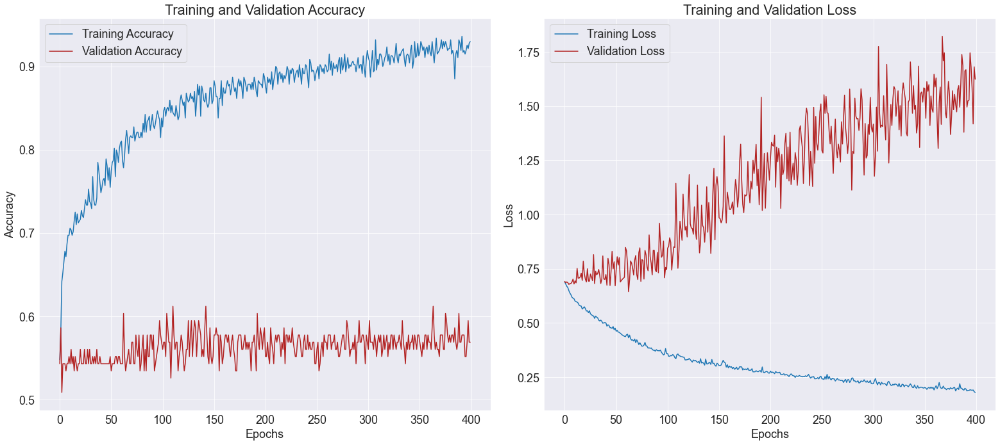

In [532]:
# Set figure size
acc2 = history2.history['accuracy']
val_acc2 = history2.history['val_accuracy']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(epochs_range, acc2, label='Training Accuracy')
ax2 = plt.plot(epochs_range, val_acc2, label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(epochs_range, loss2, label='Training Loss')
ax2 = plt.plot(epochs_range, val_loss2, label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)
plt.tight_layout()
plt.savefig('Metrics_Graphs2/model1rgb')
plt.show()



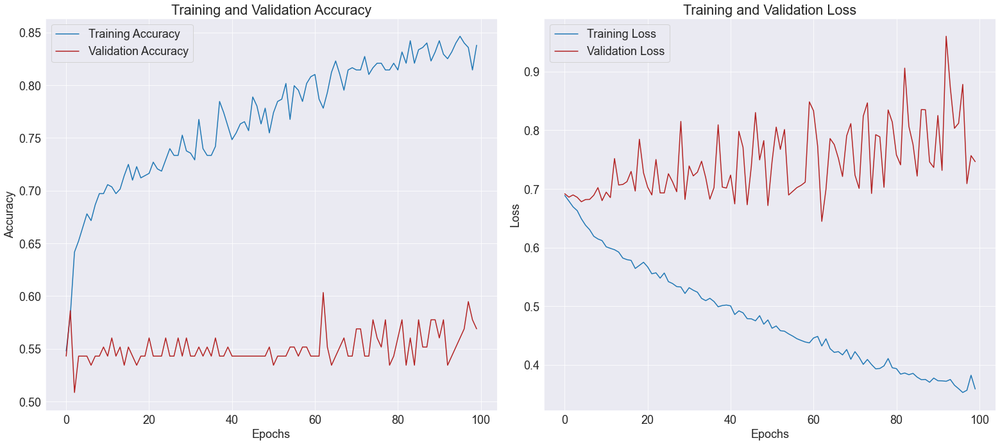

In [538]:
# Set figure size
acc2 = history2.history['accuracy']
val_acc2 = history2.history['val_accuracy']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '18'
# plot 1:
plt.subplot(1, 2, 1)
ax1 = plt.plot(range(100), acc2[:100], label='Training Accuracy')
ax2 = plt.plot(range(100), val_acc2[:100], label='Validation Accuracy', color='firebrick')

plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
ax1 = plt.plot(range(100), loss2[:100], label='Training Loss')
ax2 = plt.plot(range(100), val_loss2[:100], label='Validation Loss', color='firebrick')

plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Training and Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)
plt.tight_layout()
plt.savefig('Metrics_Graphs2/model1rgb')
plt.show()



In [454]:
metric = tf.keras.metrics.BinaryAccuracy(threshold = 0.5)
metric.update_state(y_true,y_pred)
metric.result().numpy()

0.773913

# Comparing models

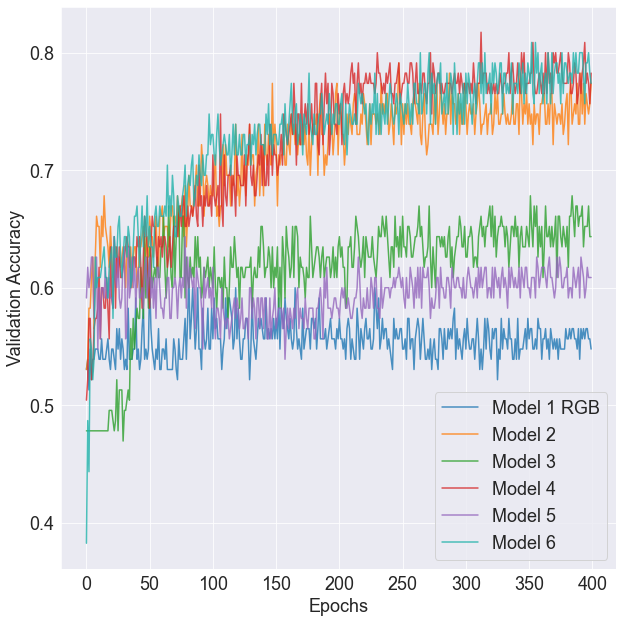

In [446]:
# Set figure size
sns.color_palette("Set2")
epochs_range = range(400)
plt.figure(figsize=(9,9))
plt.rcParams['font.size'] = '18'

ax1 = plt.plot(epochs_range, val_acc2, label='Model 1 RGB', alpha=0.8)
ax2 = plt.plot(epochs_range, val_acc, label='Model 2', alpha=0.8)
ax3 = plt.plot(epochs_range, val_acc3, label='Model 3', alpha=0.8)
ax4 = plt.plot(epochs_range, val_acc7_2, label='Model 4', alpha=0.8)
ax5 = plt.plot(epochs_range, val_acc8_2, label='Model 5', alpha=0.8)
ax6 = plt.plot(epochs_range, val_acc9_3, label='Model 6', color='lightseagreen', alpha=0.8)


plt.ylabel('Validation Accuracy')
plt.xlabel('Epochs')
plt.legend()
#plt.title('Validation Accuracy')


plt.tight_layout()
plt.savefig('Metrics_Graphs2/Comparinggraphs1_6')
plt.show()



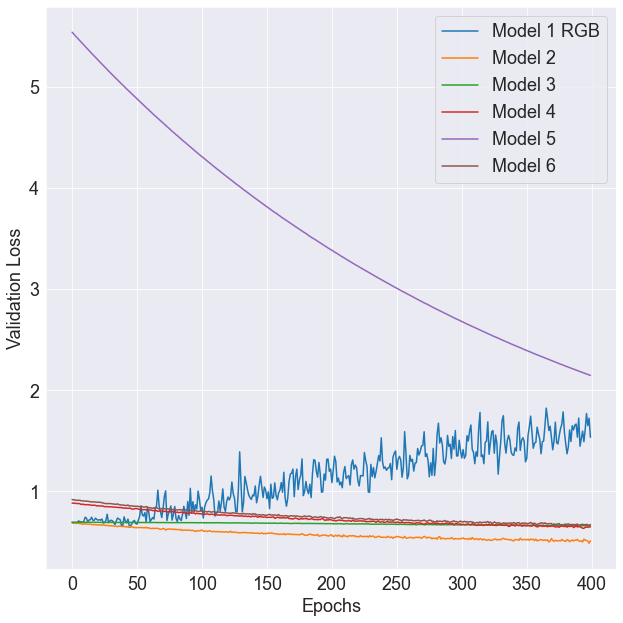

In [453]:
# plot 2:
epochs_range = range(400)
plt.figure(figsize=(9,9))
plt.rcParams['font.size'] = '18'



ax1 = plt.plot(epochs_range, val_loss2, label='Model 1 RGB')
ax2 = plt.plot(epochs_range, val_loss, label='Model 2')
ax3 = plt.plot(epochs_range, val_loss3, label='Model 3')
ax4 = plt.plot(epochs_range, val_loss7_2, label='Model 4')            
ax5 = plt.plot(epochs_range, val_loss8_2, label='Model 5')
ax6 = plt.plot(epochs_range, val_loss9_3, label='Model 6')

plt.ylabel('Validation Loss')
plt.xlabel('Epochs')
plt.legend()
#plt.title('Validation Loss')
plt.tight_layout()
plt.savefig('Metrics_Graphs2/ComparingAllValLoss')
plt.show()

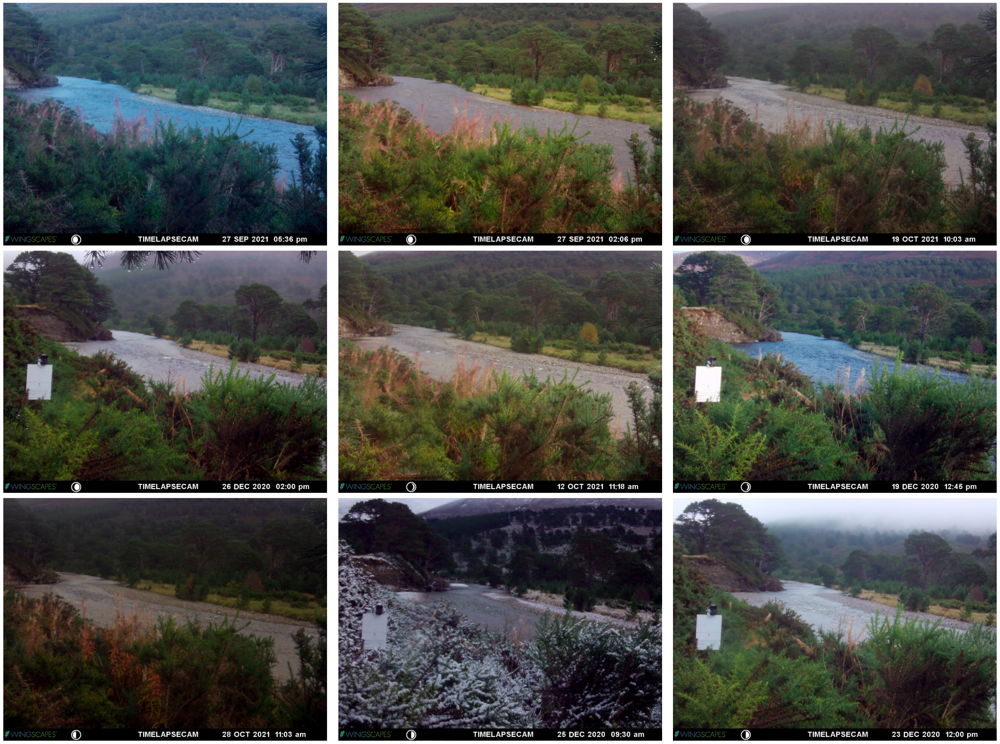

In [37]:
plt.figure(figsize=(30, 22))
plt.subplot(3,3,1)
plt.imshow(cv2.cvtColor(high_img_collection[1], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,2)
plt.imshow(cv2.cvtColor(high_img_collection[3], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,3)
plt.imshow(cv2.cvtColor(high_img_collection[22], cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(3,3,4)
plt.imshow(cv2.cvtColor(high_img_collection[140], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,5)
plt.imshow(cv2.cvtColor(high_img_collection[55], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,6)
plt.imshow(cv2.cvtColor(high_img_collection[90], cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(3,3,7)
plt.imshow(cv2.cvtColor(high_img_collection[100], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,8)
plt.imshow(cv2.cvtColor(high_img_collection[300], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(3,3,9)
plt.imshow(cv2.cvtColor(high_img_collection[303], cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
#plt.savefig('4_c_grey_closedimages')


plt.show()

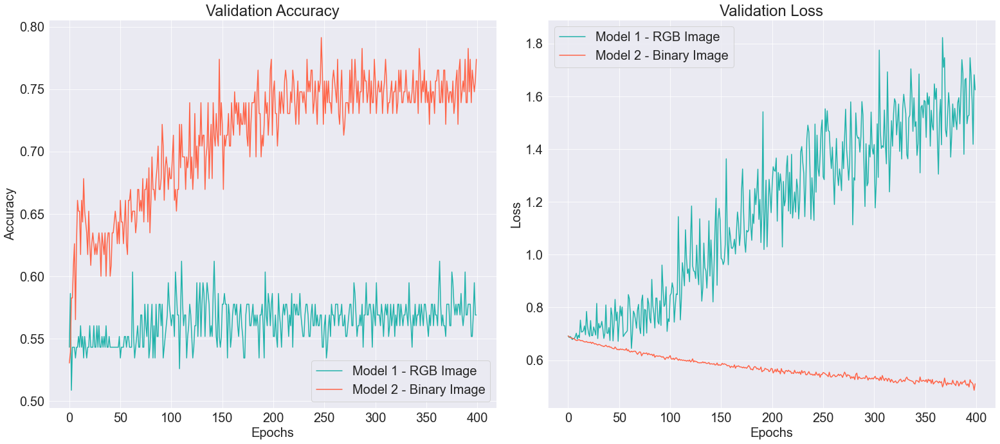

In [576]:
# Set figure size

plt.figure(figsize=(22,10))
plt.rcParams['font.size'] = '20'
# plot 1:
plt.subplot(1, 2, 1)
#ax1 = plt.plot(epochs_range, acc2, label='RGB Model Training Accuracy', color='skyblue')
ax2 = plt.plot(epochs_range, val_acc2, label='Model 1 - RGB Image', 
               color='lightseagreen')
#ax3 = plt.plot(epochs_range, acc, label='Binary Model Training Accuracy', color='indianred')
ax4 = plt.plot(epochs_range, val_acc, label='Model 2 - Binary Image', 
               color='tomato')



plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.title('Validation Accuracy')

# plot 2:
plt.subplot(1, 2, 2 )
#ax1 = plt.plot(epochs_range, loss2, label='RGB Model Training Loss', color='skyblue')
ax2 = plt.plot(epochs_range, val_loss2, label='Model 1 - RGB Image ', 
               color='lightseagreen')
#ax3 = plt.plot(epochs_range, loss, label='Binary Model Training Loss', color='tomato')
ax4 = plt.plot(epochs_range, val_loss, label='Model 2 - Binary Image', 
               color='tomato')







plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.title('Validation Loss')
#plt.suptitle(str(epochs) + " Epochs", y=1)
plt.tight_layout()
plt.savefig('Metrics_Graphs2/ComparingRBGandBW')
plt.show()



fit() is for training the model with the given inputs (and corresponding training labels).

evaluate() is for evaluating the already trained model using the validation (or test) data and the corresponding labels. Returns the loss value and metrics values for the model.

predict() is for the actual prediction. It generates output predictions for the input samples.